### Import Libraries

In [1]:
# Import codes

import pandas as pd
from datetime import timedelta, datetime
import matplotlib.pyplot as plt
%matplotlib inline
plt.style.use('fivethirtyeight')

import warnings

from pandas.plotting import register_matplotlib_converters
register_matplotlib_converters()

from statsmodels.tsa.stattools import adfuller
import statsmodels.api as sm
from statsmodels.tsa.seasonal import seasonal_decompose

In [2]:
# read in data
df = pd.read_csv('./Datasets/cleaned_df.csv')

In [3]:
# change date column to be datetime dtype
df['date'] = pd.to_datetime(df['date'])

In [4]:
# set and sort the index for df
df.set_index('date', inplace=True)
df.sort_index(inplace=True)

In [5]:
# check df
df.head()

,state_name,county_name,county_code,aqi,category,defining_parameter,defining_site,number_of_sites_reporting
date,,,,,,,,
2009-01-01,California,Fresno,19,104,Unhealthy for Sensitive Groups,PM2.5,06-019-0008,7
2009-01-01,California,Mendocino,45,20,Good,Ozone,06-045-0008,1
2009-01-01,California,Mono,51,56,Moderate,PM10,06-051-0001,3
2009-01-01,California,Inyo,27,53,Moderate,PM10,06-027-1003,14
2009-01-01,California,Orange,59,156,Unhealthy,PM2.5,06-059-0007,4


# Testing for Stationarity

---

We created a for loop to go through each county and show the Test Statistic and P-Value for each county's AQI score. If stationarity is confirmed we do not need to adjust data with differencing to achieve stationarity.

In [6]:
# create a dictionary that will be populated with values for each county
my_dict = {"County":[],"T-Stat":[],"P-Value":[]};

# loop through each county
for i in df.county_name.unique().tolist():
    
    # generate a mask for each county
    mask=df[df['county_name']== i]
    
    # create variables for t and p values
    t = adfuller(mask['aqi'])[0]
    p = adfuller(mask['aqi'])[1]
    
    # add the appropriate value to the lists in the dictioanry values
    my_dict["County"].append(i)
    my_dict["T-Stat"].append(t)
    my_dict["P-Value"].append(p)

In [7]:
# displaying the scores 
pd.DataFrame(my_dict).style 

,County,T-Stat,P-Value
0,Fresno,-7.902655,0.000000
1,Mendocino,-8.988391,0.000000
2,Mono,-60.019670,0.000000
3,Inyo,-16.186964,0.000000
4,Orange,-18.294491,0.000000
5,Glenn,-16.650285,0.000000
6,Napa,-14.129972,0.000000
7,Kings,-8.036858,0.000000
8,Stanislaus,-8.823738,0.000000
9,Ventura,-9.659057,0.000000


From the above we can conclude 

# Each County Trending Analysis

In [8]:
# create a county list variable as this will be used a lot in the rest of this notebook
county = df.county_name.unique().tolist()

<ipython-input-9-59d7104022d7>:8: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=(20, 6))


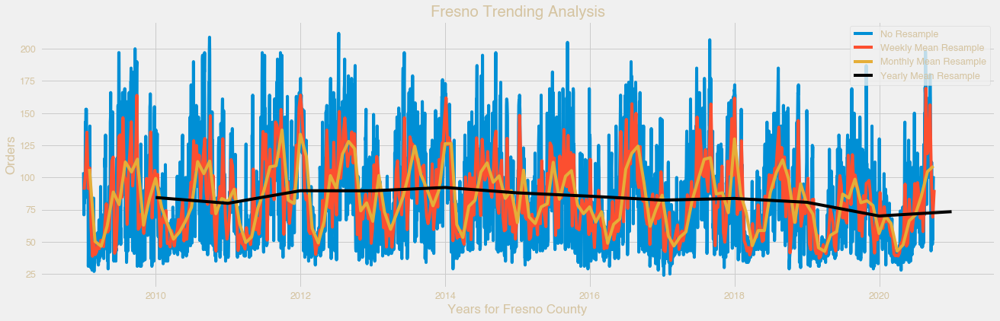

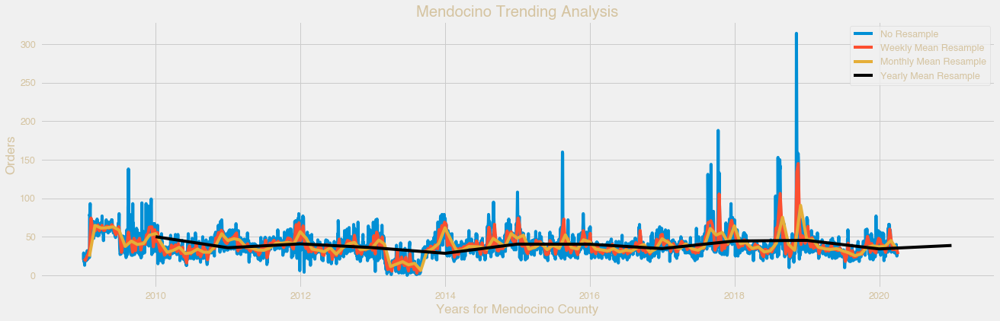

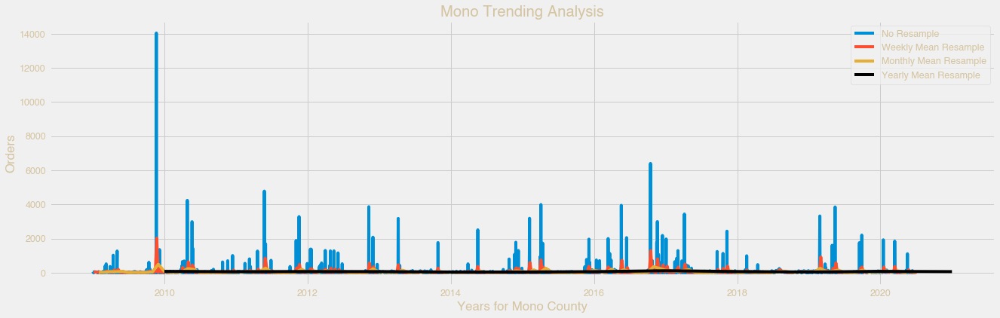

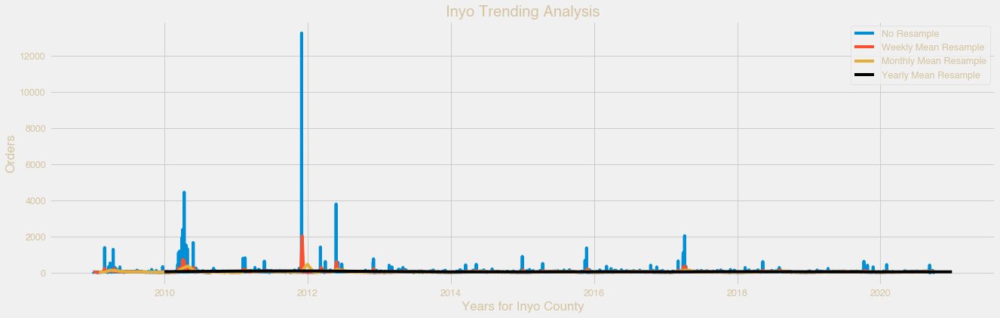

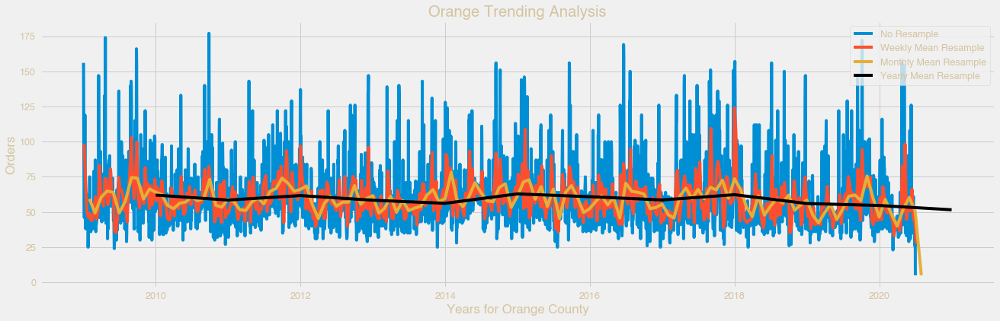

...

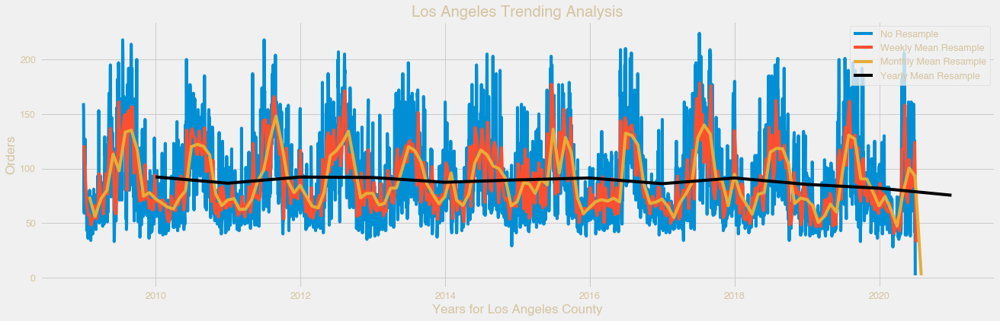

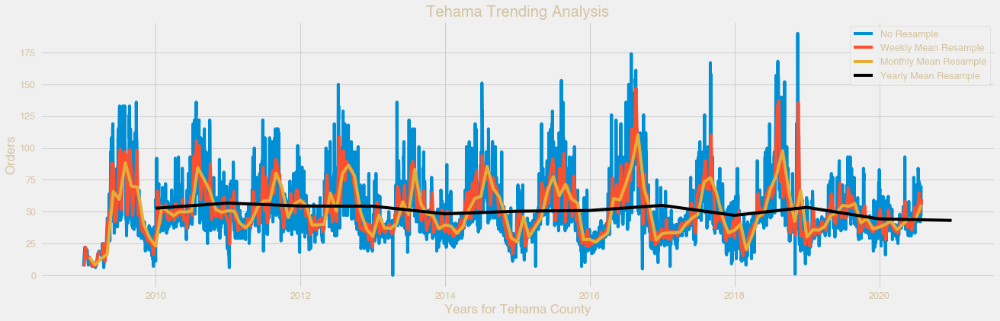

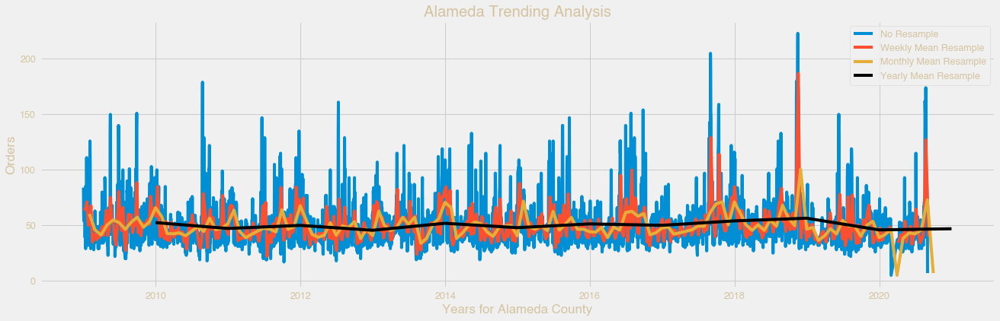

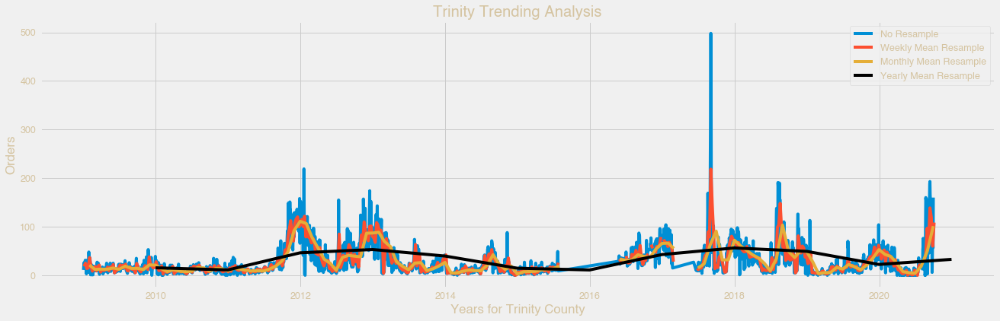

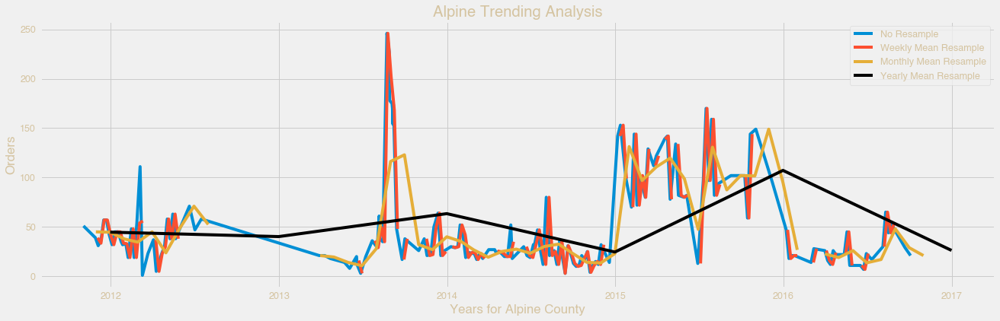

In [9]:
# generat a loop to go through each county
for i in county:
    
    # create mask for each county
    mask = df[df['county_name'] == i]
    
    # set figsize
    fig, ax = plt.subplots(figsize=(20, 6))

    # plot with no resampling, weekly, monthly, annual resampling
    ax.plot(mask['aqi'], label='No Resample')
    ax.plot(mask['aqi'].resample('W').mean(), label='Weekly Mean Resample')
    ax.plot(mask['aqi'].resample('M').mean(), label='Monthly Mean Resample')
    ax.plot(mask['aqi'].resample('Y').mean(), label='Yearly Mean Resample', color='black')
    
    # set title
    plt.title(f'{i} Trending Analysis')
    
    # label x & y axis
    ax.set_xlabel(f'Years for {i} County')
    ax.set_ylabel('Orders')

    # set legend
    ax.legend();

From the above we can see there is some seasonality in our data towards the later half of the year, but not at the end of the year. This holds firm our assumption that fires have been seasonally occuring in California in the fall. At the same time, we can see the AQI consistently gets to the lowest levels at the end of each year. 

We can further investigate seasonality with a seasonal decomposition graph. 

In [10]:
# develope a function to to show seasonal_decompose over different frequencies of time
def seasons(y, n):
    
    # call seasonal_decompose
    decomposition = seasonal_decompose(y, period=n)
    
    # set the plot
    fig = decomposition.plot()
    
    # set the pot size
    fig.set_size_inches(14,7)


In [11]:
# create a function to iterate through a list of values and create seasonal decomposition plots for each value
def seasonal_decom_graphs(n, lst):
    
    # iterate through list
    for i in lst:
        
        # create masks
        mask = df[df['county_name'] == i]
        
        # include title for each graph
        plt.title(f'AQI for {i} on a {n} basis')
        
        # generate annual decomp score
        seasons(mask['aqi'], n)

/opt/anaconda3/envs/dsi/lib/python3.8/site-packages/statsmodels/tsa/seasonal.py:291: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(len(series), 1)


ValueError: x must have 2 complete cycles requires 730 observations. x only has 168 observation(s)

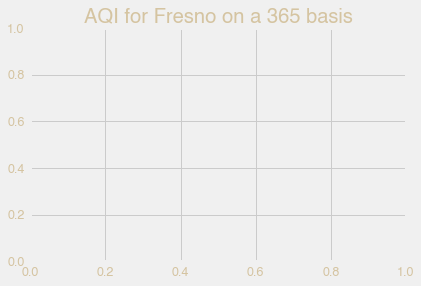

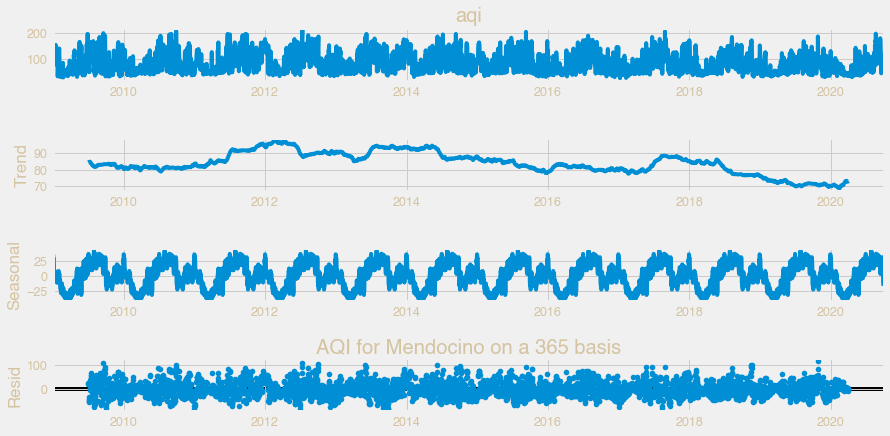

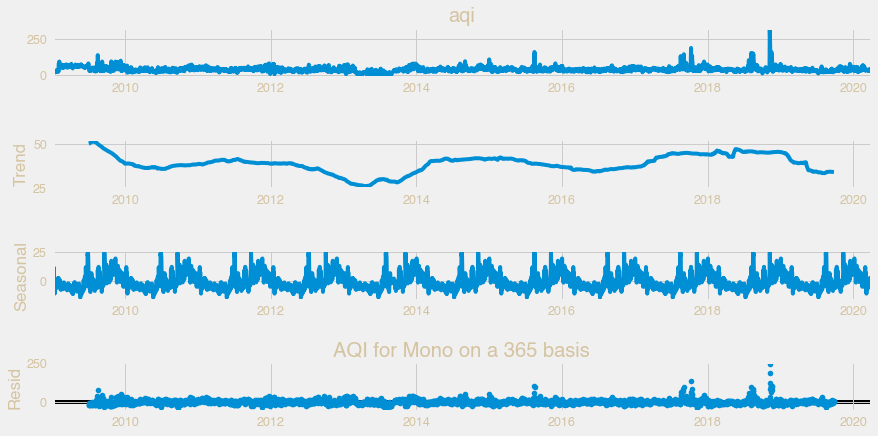

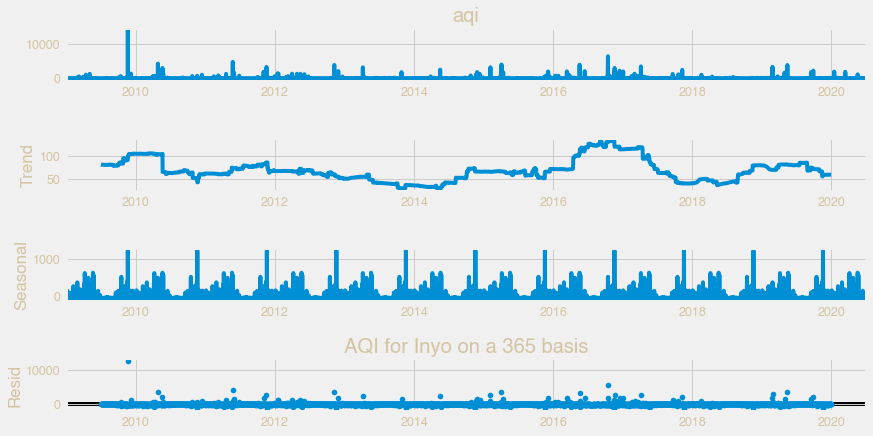

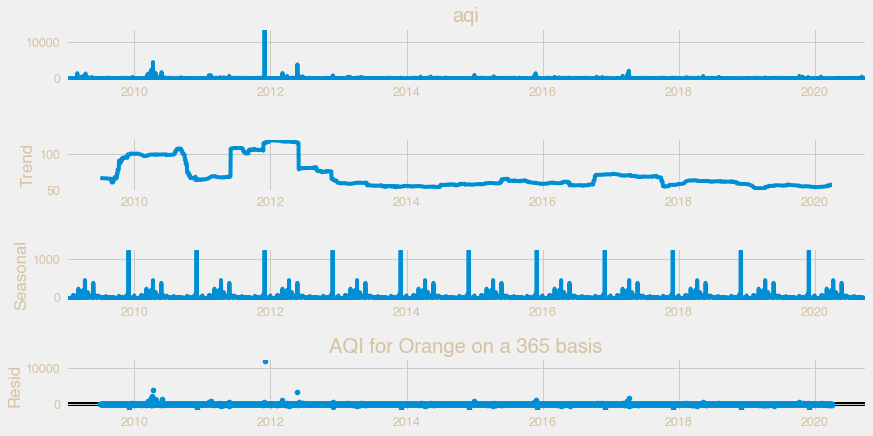

...

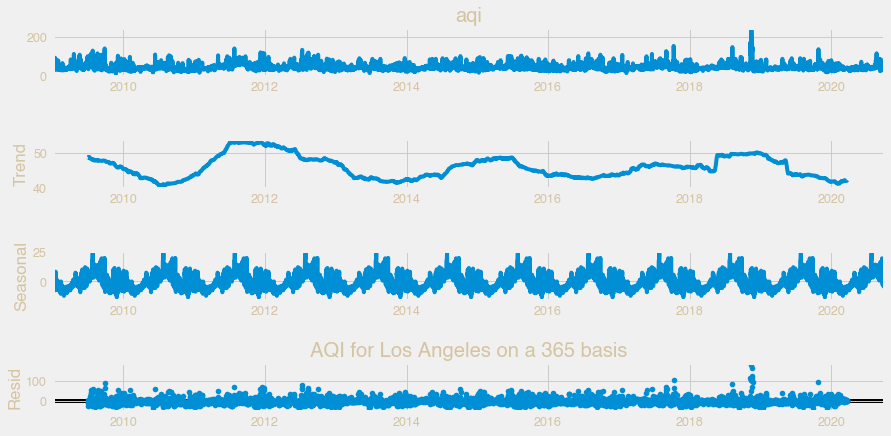

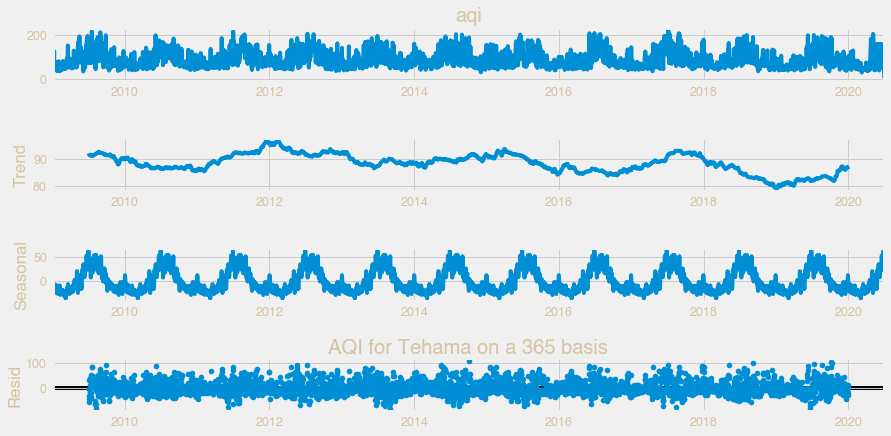

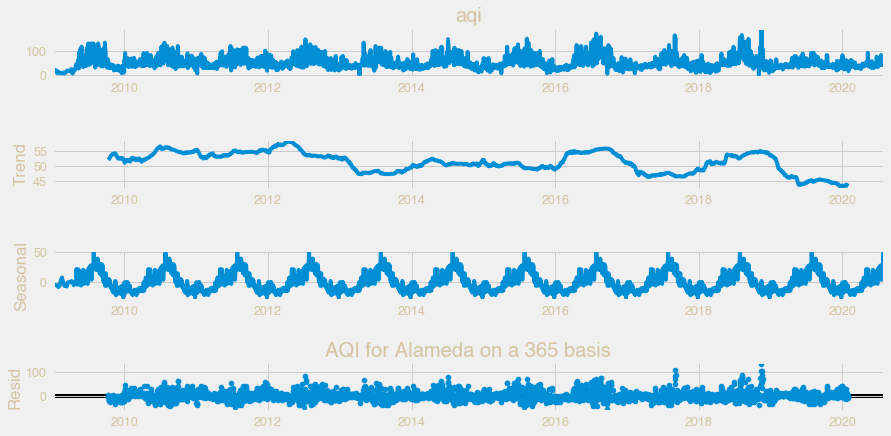

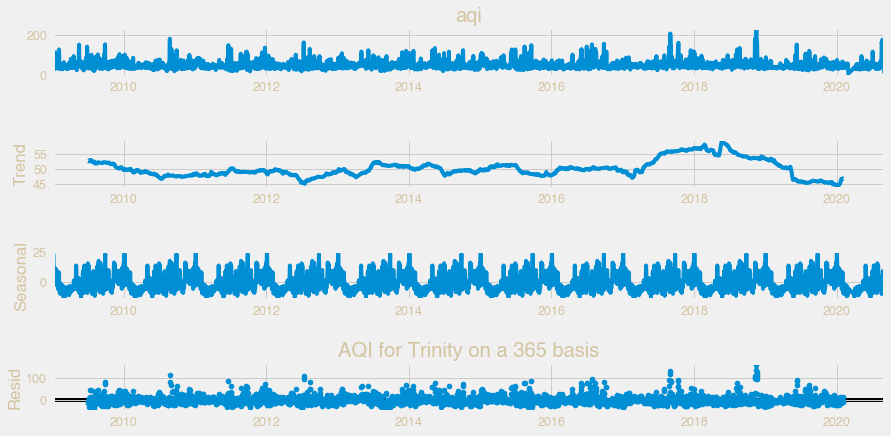

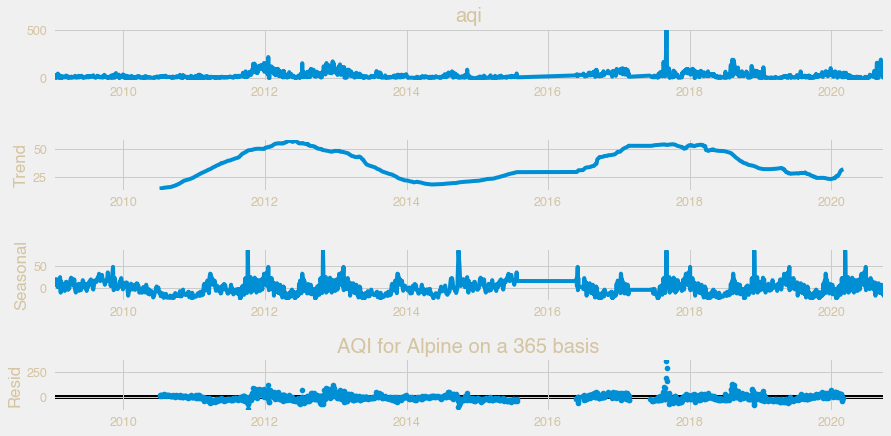

In [12]:
seasonal_decom_graphs(365, county)

In [13]:
# annual seasonality for all counties
for i in county:
    
    # create mask for each county
    mask = df[df['county_name'] == i]
    
    if len(mask >= 730):
        
        # include a title for each one
        plt.title(f'AQI for {i}')
        
        # generate annual demoposition score
        seasons(mask['aqi'], 365)

TypeError: '>=' not supported between instances of 'str' and 'int'

In [ ]:
seasonal_decom_graphs(180, county)

In [ ]:
#half a year seasonality in Los Angeles
seasons(la['aqi'], 180)

In [ ]:
# monthly seasonality
seasons(y, 30)

# Stationarity for LA

In [ ]:
### plot for Rolling Statistic for testing Stationarity
def test_stationarity(timeseries, title):
    
    #Determing rolling statistics
    rolmean = pd.Series(timeseries).rolling(window=12).mean() 
    rolstd = pd.Series(timeseries).rolling(window=12).std()
    
    # 
    fig, ax = plt.subplots(figsize=(16, 4))
    ax.plot(timeseries, label= title)
    ax.plot(rolmean, label='rolling mean');
    ax.plot(rolstd, label='rolling std (x10)');
    ax.legend()

In [ ]:
pd.options.display.float_format = '{:.8f}'.format
test_stationarity(y,'raw data')

Both the mean and standard deviation for stationary data does not change much over time. But in this case, since the y-axis has such a large scale, we can not confidently conclude that our data is stationary by simply viewing the above graph. Therefore, we should do another test of stationarity.



In [ ]:
# Augmented Dickey-Fuller Test


def ADF_test(timeseries, dataDesc):
    print(' > Is the {} stationary ?'.format(dataDesc))
    dftest = adfuller(timeseries.dropna(), autolag='AIC')
    print('Test statistic = {:.3f}'.format(dftest[0]))
    print('P-value = {:.3f}'.format(dftest[1]))
    print('Critical values :')
    for k, v in dftest[4].items():
        print('\t{}: {} - The data is {} stationary with {}% confidence'.format(k, v, 'not' if v<dftest[0] else '', 100-int(k[:-1])))

In [ ]:
ADF_test(y,'raw data')

# Making Data Stationary

In [ ]:
# Detrending
#y_detrend =  (y - y.rolling(window=12).mean())/y.rolling(window=12).std()

#test_stationarity(y_detrend,'de-trended data')
#ADF_test(y_detrend,'de-trended data')

# Differencing
#y_12lag =  y - y.shift(12)

#test_stationarity(y_12lag,'12 lag differenced data')
#ADF_test(y_12lag,'12 lag differenced data')

# Detrending + Differencing

#y_12lag_detrend =  y_detrend - y_detrend.shift(12)

#test_stationarity(y_12lag_detrend,'12 lag differenced de-trended data')
#ADF_test(y_12lag_detrend,'12 lag differenced de-trended data')

# Create Training & Testing Datasets

In [14]:
y = y.resample('w').mean()

NameError: name 'y' is not defined

In [5]:
y['2019-12-31':]

NameError: name 'y' is not defined

In [6]:
y_to_train = y[:'2020-03-29'] # dataset to train
y_to_val = y['2020-04-05':] # last X months for test  
predict_date = len(y) - len(y[:'2020-04-05']) # the number of data points for the test set

NameError: name 'y' is not defined

# SARIMA MODEL

In [123]:
import itertools

def sarima_grid_search(y,seasonal_period):
    p = d = q = range(0, 2)
    pdq = list(itertools.product(p, d, q))
    seasonal_pdq = [(x[0], x[1], x[2],seasonal_period) for x in pdq]
    
    mini = float('+inf')
    
    
    for param in pdq:
        for param_seasonal in seasonal_pdq:
            try:
                mod = sm.tsa.statespace.SARIMAX(y,
                                                order=param,
                                                seasonal_order=param_seasonal,
                                                enforce_stationarity=False,
                                                enforce_invertibility=False)

                results = mod.fit()
                
                if results.aic < mini:
                    mini = results.aic
                    param_mini = param
                    param_seasonal_mini = param_seasonal

#                 print('SARIMA{}x{} - AIC:{}'.format(param, param_seasonal, results.aic))
            except:
                continue
    print('The set of parameters with the minimum AIC is: SARIMA{}x{} - AIC:{}'.format(param_mini, param_seasonal_mini, mini))

In [124]:
sarima_grid_search(y,52)

The set of parameters with the minimum AIC is: SARIMA(1, 1, 1)x(0, 1, 1, 52) - AIC:4417.628186998436


In [2]:
# Call this function after pick the right(p,d,q) for SARIMA based on AIC               
def sarima_eva(y,order,seasonal_order,seasonal_period,pred_date,y_to_test):
    # fit the model 
    mod = sm.tsa.statespace.SARIMAX(y,
                                order=order,
                                seasonal_order=seasonal_order,
                                enforce_stationarity=False,
                                enforce_invertibility=False)

    results = mod.fit()
    print(results.summary().tables[1])
    
    results.plot_diagnostics(figsize=(16, 8))
    plt.show()
    
    # The dynamic=False argument ensures that we produce one-step ahead forecasts, 
    # meaning that forecasts at each point are generated using the full history up to that point.
    pred = results.get_prediction(start=pd.to_datetime(pred_date), dynamic=False)
    pred_ci = pred.conf_int()
    y_forecasted = pred.predicted_mean
    mse = ((y_forecasted - y_to_test) ** 2).mean()
    print('The Root Mean Squared Error of SARIMA with season_length={} and dynamic = False {}'.format(seasonal_period,round(np.sqrt(mse), 2)))

    ax = y.plot(label='observed')
    y_forecasted.plot(ax=ax, label='One-step ahead Forecast', alpha=.7, figsize=(14, 7))
    ax.fill_between(pred_ci.index,
                    pred_ci.iloc[:, 0],
                    pred_ci.iloc[:, 1], color='k', alpha=.2)

    ax.set_xlabel('Date')
    ax.set_ylabel('Sessions')
    plt.legend()
    plt.show()

    # A better representation of our true predictive power can be obtained using dynamic forecasts. 
    # In this case, we only use information from the time series up to a certain point, 
    # and after that, forecasts are generated using values from previous forecasted time points.
    pred_dynamic = results.get_prediction(start=pd.to_datetime(pred_date), dynamic=True, full_results=True)
    pred_dynamic_ci = pred_dynamic.conf_int()
    y_forecasted_dynamic = pred_dynamic.predicted_mean
    mse_dynamic = ((y_forecasted_dynamic - y_to_test) ** 2).mean()
    print('The Root Mean Squared Error of SARIMA with season_length={} and dynamic = True {}'.format(seasonal_period,round(np.sqrt(mse_dynamic), 2)))

    ax = y.plot(label='observed')
    y_forecasted_dynamic.plot(label='Dynamic Forecast', ax=ax,figsize=(14, 7))
    ax.fill_between(pred_dynamic_ci.index,
                    pred_dynamic_ci.iloc[:, 0],
                    pred_dynamic_ci.iloc[:, 1], color='k', alpha=.2)

    ax.set_xlabel('Date')
    ax.set_ylabel('Sessions')

    plt.legend()
    plt.show()
    
    return (results)

In [3]:
import numpy as np
model = sarima_eva(y,(1, 1, 1),(0, 1, 1, 52),52,'2020-04-05',y_to_val)

NameError: name 'y' is not defined

1. The top left plot shows the residuals over time. We do not want to see any obvious seasonality here and the messier it is, the better we can say we found the trend and seasonality in our data and removed the noise.

2. In the top-right plot, we want to see that the red KDE line follows closely with the N(0,1) line to indicate that the residuals are normally distributed. This line is the standard notation for a normal distribution with a mean of 0 and a standard deviation of 1.

3. In the bottom left qq-plot, you see the ordered distribution of residuals (blue dots) following the linear trend (red line) of the samples taken from a standard normal distribution with N(0, 1).

4. The autocorrelation visual (called a “correlogram”) on the bottom right shows that the time series residuals have a low correlation with the lagged versions of itself (that is, the majority of dots fall into the blue shaded area).

By validating all the four points above, we can conclude that this model’s residuals are near normally distributed. This indicates we have found a well-fit model suitable for our dataset.

If we were only concerned with achieving the lowest Root Mean Squared Error, we would choose the Simple Exponential Smoothing (SES) model to use since it produced the smallest error. In many business cases where longer-term forecasting with more nuanced visualizations are needed in our overall analysis, the SARIMA model is preferred. 



In [128]:
def forecast(model,predict_steps,y):
    
    pred_uc = model.get_forecast(steps=predict_steps)

    #SARIMAXResults.conf_int, can change alpha,the default alpha = .05 returns a 95% confidence interval.
    pred_ci = pred_uc.conf_int()

    ax = y.plot(label='observed', figsize=(14, 7))
#     print(pred_uc.predicted_mean)
    pred_uc.predicted_mean.plot(ax=ax, label='Forecast')
    ax.fill_between(pred_ci.index,
                    pred_ci.iloc[:, 0],
                    pred_ci.iloc[:, 1], color='k', alpha=.25)
    ax.set_xlabel('Date')
    ax.set_ylabel(y.name)

    plt.legend()
    plt.show()
    
    # Produce the forcasted tables 
    pm = pred_uc.predicted_mean.reset_index()
    pm.columns = ['Date','Predicted_Mean']
    pci = pred_ci.reset_index()
    pci.columns = ['Date','Lower Bound','Upper Bound']
    final_table = pm.join(pci.set_index('Date'), on='Date')
    
    return (final_table)


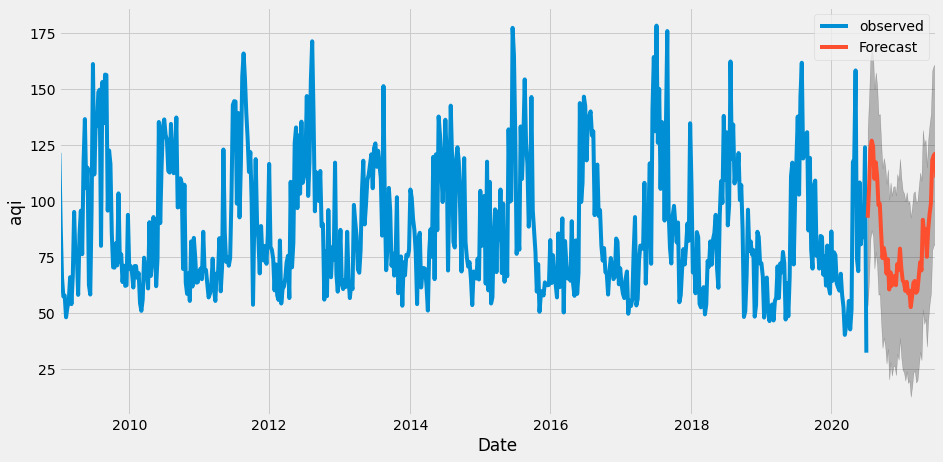

,Date,Predicted_Mean,Lower Bound,Upper Bound
0,2020-07-12,92.53748445,53.40309753,131.67187137
1,2020-07-19,105.50743370,65.50815536,145.50671204
2,2020-07-26,123.32098638,83.27103751,163.37093524
3,2020-08-02,126.96896793,86.91237356,167.02556230
4,2020-08-09,124.44801997,84.38881544,164.50722451


In [129]:
final_table = forecast(model,52,y)
final_table.head()

The green line in the graph represents the expected future data based on the forecasting model we built. The green line represents the average forecasted value for each week, and we would not be surprised to see the actual numbers track to this line for the most part. But there is no guarantee of this!

The gray area above and below the green line represents the 95 percent confidence interval and as with virtually all forecasting models, as the predictions go further into the future, the less confidence we have in our values. In this case, we are 95 percent confident that the actual sales will fall inside this range. But, there is a chance the actuals could fall completely outside this range also. The larger the future time period for which we want to predict, the larger this confidence range will be (that is, the less precise our forecast is).

# Graph of only Predicted Weeks

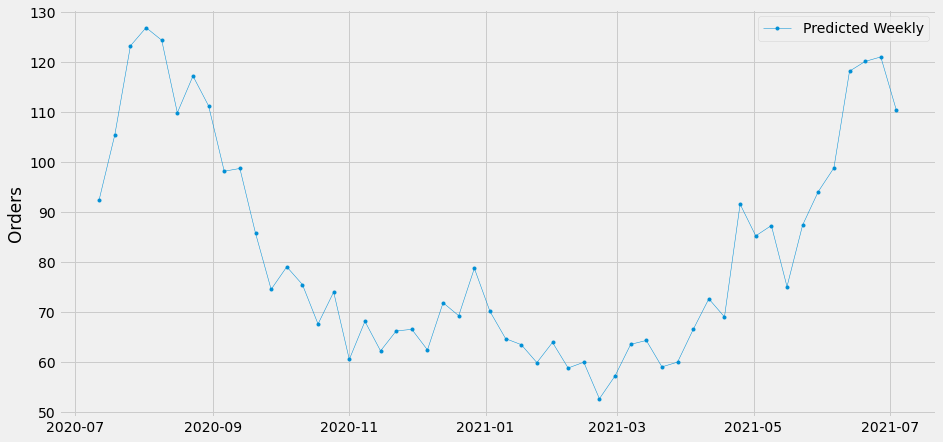

In [133]:

### Graphs show only the perdiected period
final_table.index = final_table.Date
fig, ax = plt.subplots( figsize=(14, 7))
# ax.plot(y,marker='.', linestyle='-', linewidth=0.5, label='Weekly')
ax.plot(final_table.Predicted_Mean,marker='.', linestyle='-', linewidth=0.5, label='Predicted Weekly')
# ax.plot(y.resample('M').mean(),marker='o', markersize=8, linestyle='-', label='Monthly Mean Resample')
#ax.plot(final_table.Predicted_Mean.resample('M').mean(),marker='o', markersize=8, linestyle='-', label='Predicted Monthly Mean Resample')
ax.set_ylabel('Orders')
ax.legend();